In [1]:
import qutip as qt
import numpy as np
import matplotlib.pyplot as plt
import scqubits as scq
import pandas as pd
from matplotlib.animation import FuncAnimation
import scipy.constants as sconst

%matplotlib widget

In [2]:
ratio = 70
Ec = 0.25
Ej = Ec*ratio
N = 10 # number of levels in charge basis
ng = 0.5

T_max = 250
T1 = 50
T2 = 400

P0=0.99
R0 = 5 * np.pi

def hamiltonian(Ec, Ej, N, ng):
    """
    Return the charge qubit hamiltonian as a Qobj instance.
    """
    m = np.diag(4 * Ec * (np.arange(-N,N+1)-ng)**2) + 0.5 * Ej * (np.diag(-np.ones(2*N), 1) + 
                                                               np.diag(-np.ones(2*N), -1))
                                                               
    return qt.Qobj(m)

def Hc(Ec, N, ng):
    
    m = np.diag(4 * Ec * (np.arange(-N,N+1)-ng)**2) 
    
    return qt.Qobj(m)

def Hj(Ej, N, ng):
    
    m = 0.5 * Ej * (np.diag(-np.ones(2*N), 1) + np.diag(-np.ones(2*N), -1))
    
    return qt.Qobj(m)

H_c = Hc(Ec=Ec, N=N, ng = ng)
H_j = Hj(Ej=Ej, N=N, ng=ng)

H_tot = hamiltonian(Ec, Ej, N, ng)
def EJ_tanh_pulse(t, P0, R0, T):
    return (1-P0*(1+np.tanh(-R0+(t/T)*2*R0))/2.0)

def EJ_double_pulse(t, P0, R0, T1, T2):
    return EJ_tanh_pulse(t, P0, R0, T1) + (EJ_tanh_pulse(t - T2, -P0, R0, T1) - 1)

# Time depenedent part (drive) of Hamiltonian



def Hd_coeff(t,args):
    Percentage=args['P0']
    Range=args['R0']
    T1=args['T1']
    T2=args['T2']
    return EJ_double_pulse(t, Percentage, Range, T1, T2)

def plot_energies(ng_vec, energies, ymax=(20, 3)):
    """
    Plot energy levels as a function of bias parameter ng_vec.
    """
    fig, axes = plt.subplots(1,2, figsize=(10,6))

    for n in range(len(energies[0,:])):
        axes[0].plot(ng_vec, energies[:,n])
    axes[0].set_ylim(-2, ymax[0])
    axes[0].set_xlabel(r'$n_g$', fontsize=18)
    axes[0].set_ylabel(r'$E_n$', fontsize=18)

    for n in range(len(energies[0,:])):
        axes[1].plot(ng_vec, (energies[:,n]-energies[:,0]))
    axes[1].set_ylim(-0.1, ymax[1])
    axes[1].set_xlabel(r'$n_g$', fontsize=18)
    axes[1].set_ylabel(r'$(E_n-E_0)/(E_1-E_0)$', fontsize=18)
    return fig, axes

evs = H_tot.eigenstates()[1]
energy_basis = np.empty((2*N+1, 2*N+1))
i = 0
for ev in evs:
    energy_basis[:, i] = np.array(ev).flatten()
    i+=1
energy_basis = qt.Qobj(energy_basis)
energy_basis_inv= energy_basis.inv()

# M_energy_basis = energy_basis * M_charge_basis * energy_basis_inv


 C:\Users\vamsi\AppData\Local\Temp\ipykernel_23880\2568551579.py: 79

In [70]:
thermo_beta = 1/(sconst.Boltzmann * 20e-3) # 20mK
print(sconst.Boltzmann)
qubit_freqeuncy = 2 * np.pi * 10e+9 # GHz
sx = np.zeros(shape=(2*N + 1, 2*N + 1), dtype = complex)
sx[0, 1] = 1
sx[1, 0] = 1
sx = sx/2
SX = qt.Qobj(sx)

sy = np.zeros(shape=(2*N + 1, 2*N + 1), dtype=complex)
sy[0, 1] = -1j
sy[1, 0] = 1j
sy = sy/2
SY = qt.Qobj(sy)

sz = np.zeros(shape=(2*N + 1, 2*N + 1), dtype=complex)
sz[0,0] = 1
sz[1,1] = -1
sz = sz/2
SZ = qt.Qobj(sz)

SP = qt.Qobj(sx + 1j * sy)

SM = qt.Qobj(sx - 1j * sy)

#G1 = (1/sconst.hbar**2)*np.abs(SX.matrix_element(H_tot.eigenstates()[1][0], H_tot.eigenstates()[1][1]))**2 # * noise power spectra function
G1 = 1/85000 # T1 = 85us
#GPhi = (1/sconst.hbar**2) * (np.abs(SZ.matrix_element(H_tot.eigenstates()[1][0], H_tot.eigenstates()[1][0])) - np.abs(SZ.matrix_element(H_tot.eigenstates()[1][1], H_tot.eigenstates()[1][1])))**2 # * zero-point noise power
G2 = 1/95000 # T2 = 95us
Gphi = G2 - G1/2
GPlus = G1/(1 + np.exp(thermo_beta * qubit_freqeuncy))
print(1/(1 + np.exp(thermo_beta * qubit_freqeuncy)))
GMinus = G1 - GPlus
print(GMinus)
print(Gphi)

1.380649e-23
0.0
100.0
150.0


 C:\Users\vamsi\AppData\Local\Temp\ipykernel_6992\1961228862.py: 31RuntimeWarning: overflow encountered in exp
 C:\Users\vamsi\AppData\Local\Temp\ipykernel_6992\1961228862.py: 32

In [71]:
Points=100000
tlist = np.linspace(0, T_max, Points)
H_tot_tdep = [H_c, [H_j, Hd_coeff]]
evals, ekets = H_tot.eigenstates()

psi0 = ekets[0]
n_op = (1j/np.sqrt(2 * np.sqrt((4*Ec)/(Ej/2)))) *(qt.destroy(2*N+1) - qt.create(2*N+1))
p_op = np.sqrt(np.sqrt((4*Ec)/(Ej/2))/(2)) * (qt.destroy(2*N+1) + qt.create(2*N+1))
result = qt.mesolve(H_tot_tdep, psi0, tlist, c_ops=[GMinus*SM, GPlus*SP, Gphi*SZ], e_ops=[] , args={'P0':P0, 'R0':R0, 'T1':T1, 'T2':T2}, options = qt.Options(nsteps=1000000),  progress_bar=True)



10.0%. Run time:  55.33s. Est. time left: 00:00:08:17
20.0%. Run time: 102.59s. Est. time left: 00:00:06:50
30.0%. Run time: 142.04s. Est. time left: 00:00:05:31
40.0%. Run time: 185.24s. Est. time left: 00:00:04:37
50.0%. Run time: 229.70s. Est. time left: 00:00:03:49
60.0%. Run time: 282.43s. Est. time left: 00:00:03:08
70.0%. Run time: 333.12s. Est. time left: 00:00:02:22
80.0%. Run time: 385.97s. Est. time left: 00:00:01:36
90.0%. Run time: 451.83s. Est. time left: 00:00:00:50
Total run time: 515.05s


In [3]:
Points=10000
tlist = np.linspace(0, T_max, Points)
H_tot_tdep = [H_c, [H_j, Hd_coeff]]
evals, ekets = H_tot.eigenstates()

psi0 = ekets[0]

se_out =  qt.sesolve(H_tot_tdep, psi0, tlist, args={'P0':P0, 'R0':R0, 'T1':T1, 'T2':T2}, progress_bar=True)

Ovrlp0=np.zeros(Points)
for n in range(0,Points):
   Ovrlp0[n]=np.abs(psi0.dag().overlap(se_out.states[n]))**2
   print(Ovrlp0[n])

10.0%. Run time:   0.50s. Est. time left: 00:00:00:04
20.0%. Run time:   0.99s. Est. time left: 00:00:00:03
30.0%. Run time:   1.35s. Est. time left: 00:00:00:03
40.0%. Run time:   1.73s. Est. time left: 00:00:00:02
50.0%. Run time:   2.21s. Est. time left: 00:00:00:02
60.0%. Run time:   2.62s. Est. time left: 00:00:00:01
70.0%. Run time:   3.12s. Est. time left: 00:00:00:01
80.0%. Run time:   3.51s. Est. time left: 00:00:00:00
90.0%. Run time:   3.77s. Est. time left: 00:00:00:00
Total run time:   4.03s
1.0000000000000009
1.0
1.0
1.0
1.0000000000000004
1.0
1.0
1.0000000000000004
1.0000000000000004
1.0000000000000004
1.0000000000000004
1.0000000000000004
1.0
1.0
1.0000000000000004
1.0000000000000004
0.9999999999999998
1.0000000000000004
1.0
1.0000000000000004
1.0
1.0000000000000004
1.0000000000000004
1.0000000000000009
1.0000000000000004
1.0000000000000009
1.0000000000000009
1.0
1.0000000000000004
1.0000000000000004
1.0000000000000004
1.0000000000000004
0.9999999999999998
1.00000000000

In [48]:
result.states

[Quantum object: dims = [[21], [21]], shape = (21, 21), type = oper, isherm = True
 Qobj data =
 [[0.00000000e+00 0.00000000e+00 0.00000000e+00 3.02604215e-12
   2.41968786e-11 1.54200776e-10 7.66295747e-10 2.89836007e-09
   8.12947463e-09 1.64784734e-08 2.36144178e-08 2.36144178e-08
   1.64784734e-08 8.12947463e-09 2.89836007e-09 7.66295747e-10
   1.54200776e-10 2.41968782e-11 3.02604019e-12 0.00000000e+00
   0.00000000e+00]
  [0.00000000e+00 0.00000000e+00 4.38705240e-12 4.31793297e-11
   3.45271132e-10 2.20032829e-09 1.09344600e-08 4.13574032e-08
   1.16001446e-07 2.35135335e-07 3.36959857e-07 3.36959857e-07
   2.35135335e-07 1.16001446e-07 4.13574032e-08 1.09344600e-08
   2.20032829e-09 3.45271127e-10 4.31793018e-11 4.38683078e-12
   0.00000000e+00]
  [0.00000000e+00 4.38705240e-12 5.22649188e-11 5.14414680e-10
   4.11336952e-09 2.62134958e-08 1.30267115e-07 4.92709254e-07
   1.38197715e-06 2.80127248e-06 4.01435359e-06 4.01435359e-06
   2.80127248e-06 1.38197715e-06 4.92709254e-07

NameError: name 'result' is not defined

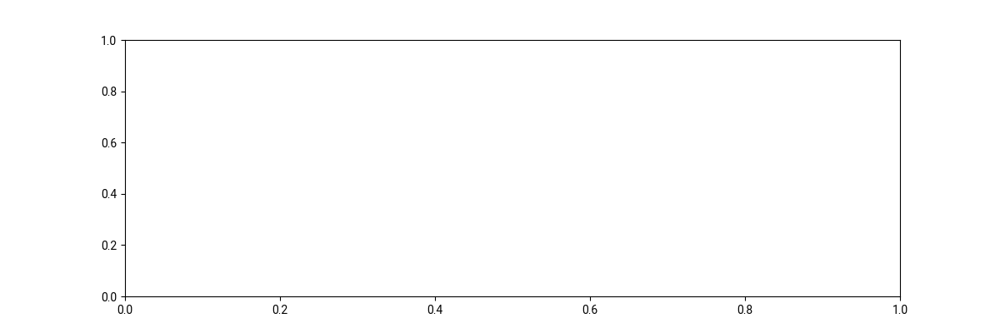

In [4]:
plt.close()
fig, ax = plt.subplots(1, 1, figsize= (12,4))
state_i = 0
for eket in [ekets[0]]:
    Ovrlp=np.zeros(Points)
    for n in range(0,Points):
        Ovrlp[n]=np.abs(eket.dag().overlap(result.states[n]))**2
    ax.plot(tlist, Ovrlp, label = f"State {state_i}")

    max_oscillation = np.max(Ovrlp)
    min_oscillation = np.min(Ovrlp)
    print(f"State {state_i}")
    print(max_oscillation)
    print(min_oscillation)
    print("-----")
    state_i += 1
ax.legend()
ax.set_xlabel("Time (ns)")
#ax.plot(tlist, Ovrlp0)
ax.set_ylabel("Percentage")
ax.set_title("Overlap with initial state")
plt.show()

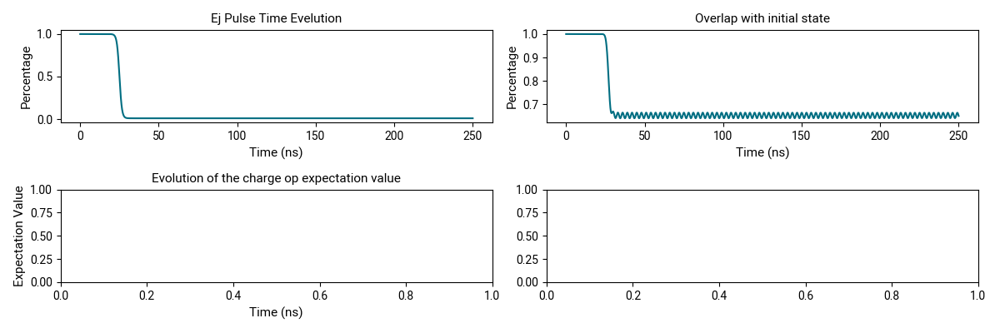

In [9]:
plt.close()
fig, ax = plt.subplots(2, 2, figsize= (12,4))
ax[0,1].plot(tlist, Ovrlp0)
ax[0,1].set_xlabel("Time (ns)")
ax[0,1].set_ylabel("Percentage")
ax[0,1].set_title("Overlap with initial state")
ax[0,0].plot(tlist, Hd_coeff(tlist, args={'P0':P0, 'R0':R0, 'T1':T1, 'T2':T2}))
ax[0,0].set_xlabel("Time (ns)")
ax[0,0].set_ylabel("Percentage")
ax[0,0].set_title("Ej Pulse Time Evelution")

"""
ax[1,1].plot(result.times, result.expect[1])
ax[1,1].set_xlabel("Time (ns)")
ax[1,1].set_ylabel("Expectation Value")
ax[1,1].set_title("Evolution of the phase op expectation value")
"""
#ax[1,0].plot(result.times, result.expect[0])
ax[1,0].set_xlabel("Time (ns)")
ax[1,0].set_ylabel("Expectation Value")
ax[1,0].set_title("Evolution of the charge op expectation value")
fig.tight_layout()
plt.show()

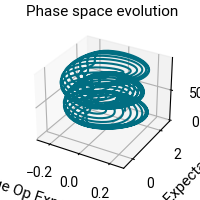

In [6]:
plt.close()
zlim = 4000
ax = plt.figure(figsize=(2,2)).add_subplot(projection='3d')
ax.plot(result.expect[0][:zlim], result.expect[1][:zlim], result.times[:zlim], '-')
ax.set_xlabel("Charge Op Expectation Value")
ax.set_ylabel("Phase Op Expectation Value")
ax.set_zlabel("Time (ns)")
ax.set_title("Phase space evolution")
plt.show()

In [ ]:
plt.close()

fig = plt.figure()
ax = plt.axes()  
plt.xlabel(r'x')
plt.ylabel(r'y')

xvec = np.linspace(-2.5, 2.5, 500)

def animate(i):
    print(str(i))
    W = qt.wigner(se_out.states[i], xvec, xvec)
    cont = plt.contourf(xvec, xvec, W, 100)

    return cont


anim = FuncAnimation(fig, animate, frames=np.arange(0, len(se_out.states), 100))
anim.save('animation.gif')